## ⚙️ Setup

### 🛍️ Libs

In [1]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


# 🎰 Data Preparations and Preprocessing

## 🔭 Data Exploration

#### Data Paths

In [2]:
main_path = 'SKU110K_fixed'
image_dirs = {
    'train': f'{main_path}/images/train',
    'valid': f'{main_path}/images/val', 
    'test': f'{main_path}/images/test'
}

label_dirs = {
    'train': f'{main_path}/labels/train',
    'valid': f'{main_path}/labels/val',
    'test': f'{main_path}/labels/test'
}

### what we have?!

In [3]:
# Let's explore what we have
for split, img_dir in image_dirs.items():
    if os.path.exists(img_dir):
        image_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        print(f"{split} set: {len(image_files)} images")
        
        # Check corresponding labels
        label_dir = label_dirs[split]
        if os.path.exists(label_dir):
            label_files = [f for f in os.listdir(label_dir) if f.lower().endswith('.txt')]
            print(f"{split} set: {len(label_files)} label files")
    print("---")

train set: 8185 images
train set: 8185 label files
---
valid set: 584 images
valid set: 584 label files
---
test set: 2920 images
test set: 2920 label files
---


## ⚙️ Processing Data

In [4]:
%%time 
from Data_prep import *

# We assume data is already split into train, valid, test directories
# We just need to preprocess each split separately

splits = ['train', 'val', 'test']

for split in splits:
    input_dir = f'SKU110K_fixed/images/{split}'
    output_dir = f'data_preprocessed/images/{split}'
    preprocess_images(input_dir, output_dir)
    
    # Labels don't need preprocessing, but we'll copy them to maintain structure
    label_input_dir = f'SKU110K_fixed/labels/{split}'
    label_output_dir = f'data_preprocessed/labels/{split}'
    
    os.makedirs(label_output_dir, exist_ok=True)
    
    # Copy label files
    for label_file in os.listdir(label_input_dir):
        if label_file.endswith('.txt'):
            with open(os.path.join(label_input_dir, label_file), 'r') as f:
                content = f.read()
            with open(os.path.join(label_output_dir, label_file), 'w') as f:
                f.write(content)
    
    print(f"Copied labels to {label_output_dir}")

Preprocessed images saved to data_preprocessed/images/train
Copied labels to data_preprocessed/labels/train
Preprocessed images saved to data_preprocessed/images/val
Copied labels to data_preprocessed/labels/val
Preprocessed images saved to data_preprocessed/images/test
Copied labels to data_preprocessed/labels/test
CPU times: total: 23min 3s
Wall time: 22min 23s


# 📊 EDA

Dataset Statistics:
   split  num_images  num_objects  avg_objects_per_image  products_count  \
0  train        8185      1203268             147.008919         1203268   
1    val         584        90456             154.890411           90456   
2   test        2920       429411             147.058562          429411   

   empty_slots_count  
0                  0  
1                  0  
2                  0  


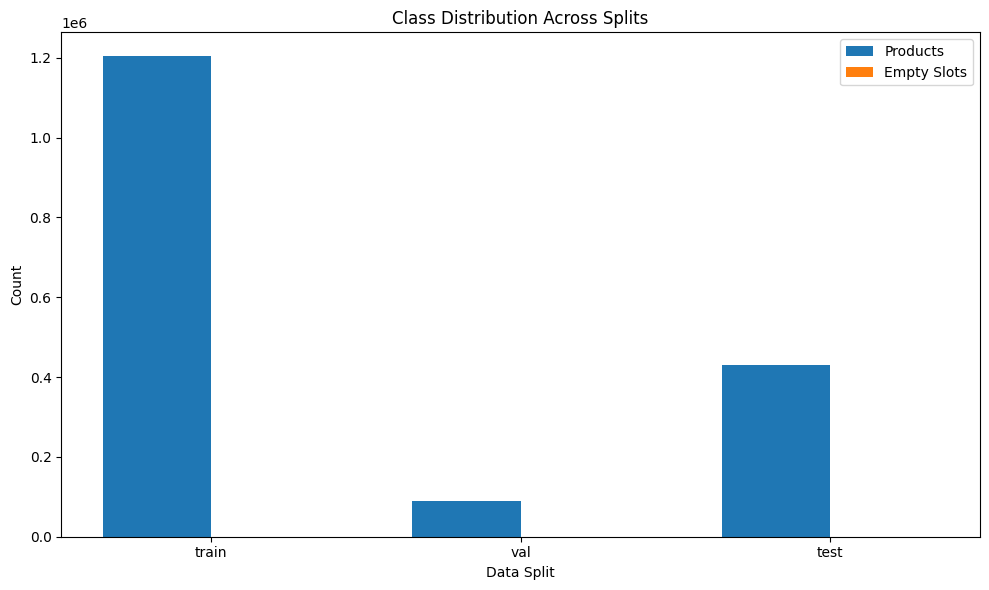

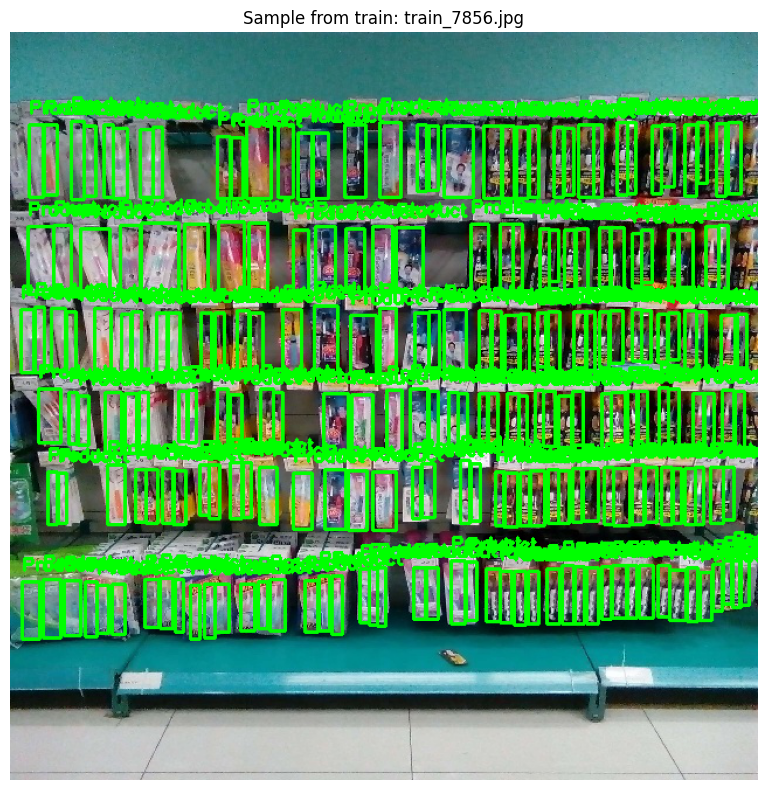

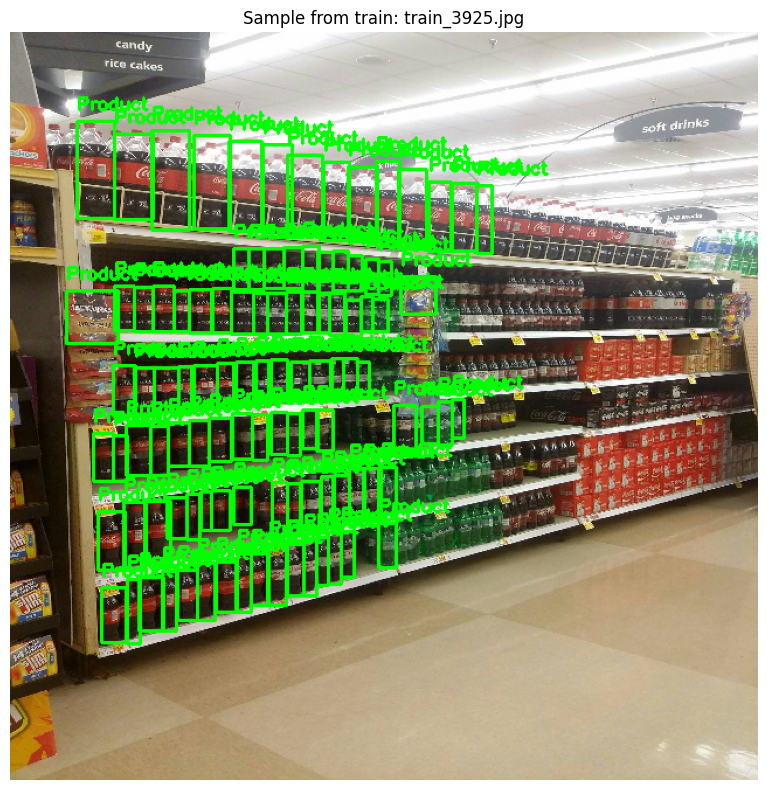

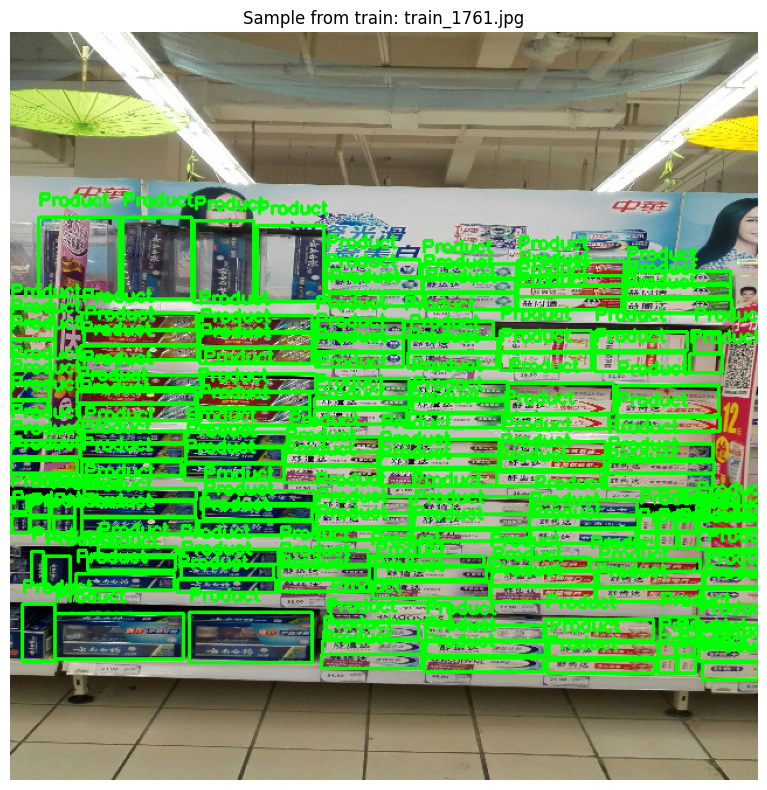

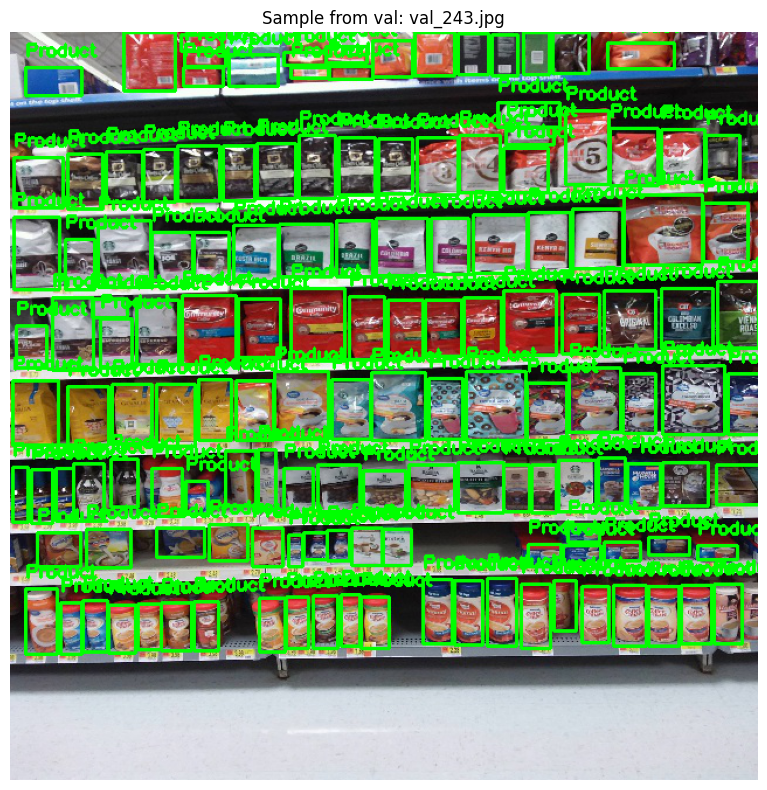

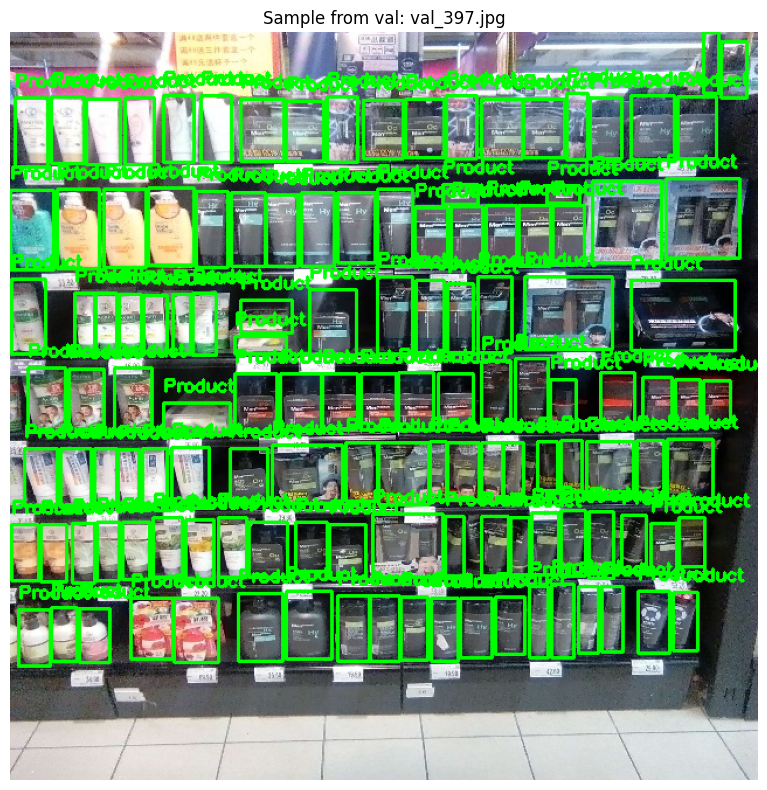

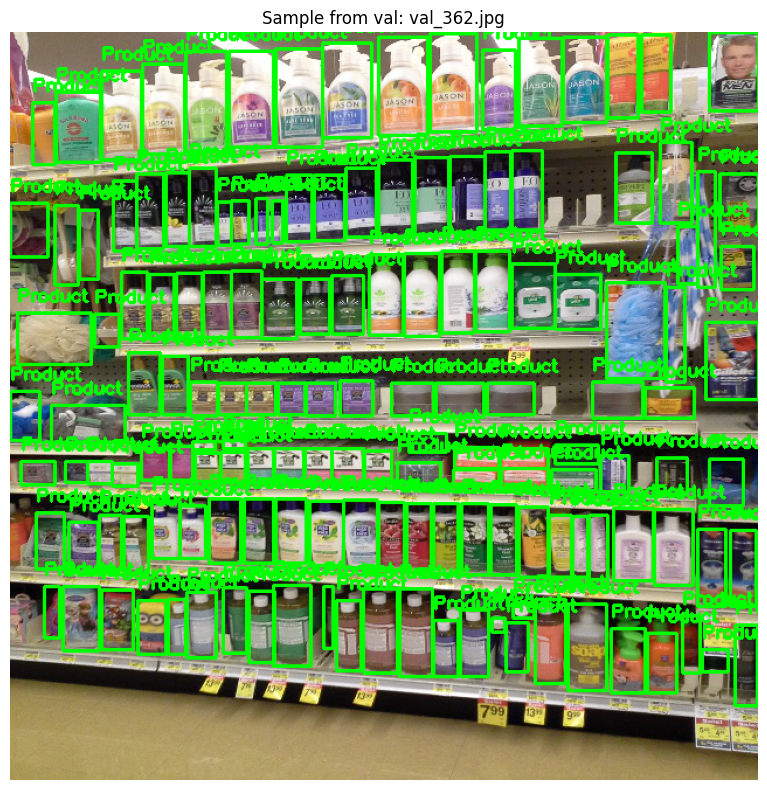

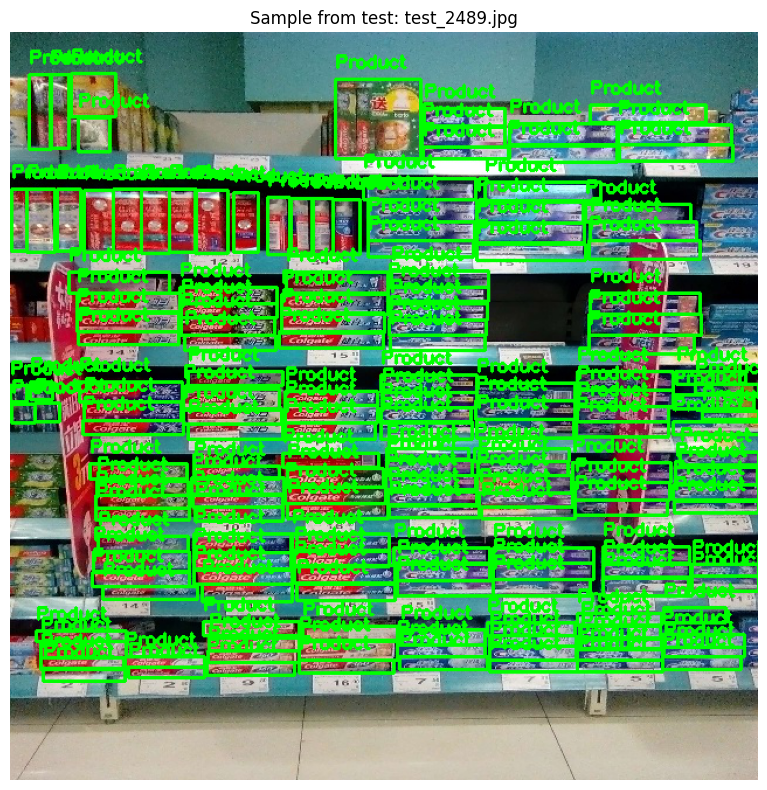

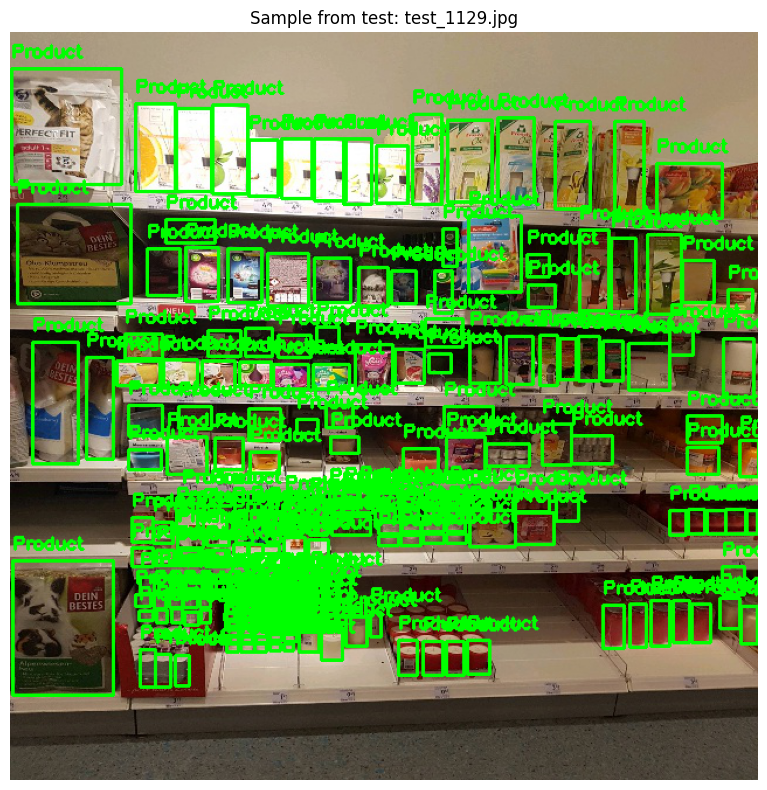

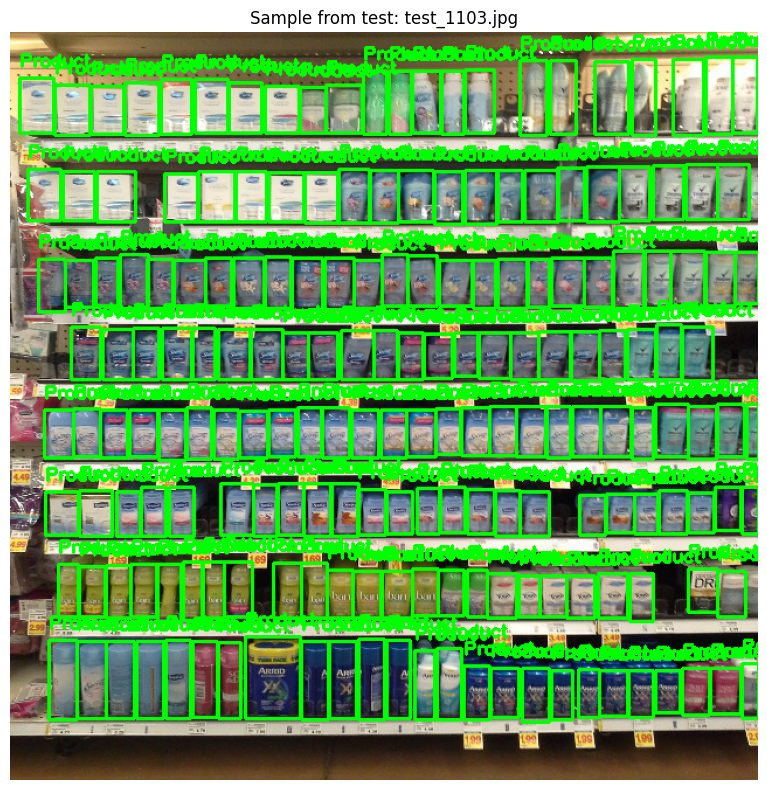

Shelf Health Metrics Summary:
       total_objects  products_count  empty_slots_count  fill_percentage  \
count   11689.000000    11689.000000            11689.0          11689.0   
mean      147.415091      147.415091                0.0            100.0   
std        43.494457       43.494457                0.0              0.0   
min         1.000000        1.000000                0.0            100.0   
25%       123.000000      123.000000                0.0            100.0   
50%       138.000000      138.000000                0.0            100.0   
75%       162.000000      162.000000                0.0            100.0   
max       718.000000      718.000000                0.0            100.0   

       shelf_health_score  
count             11689.0  
mean                100.0  
std                   0.0  
min                 100.0  
25%                 100.0  
50%                 100.0  
75%                 100.0  
max                 100.0  


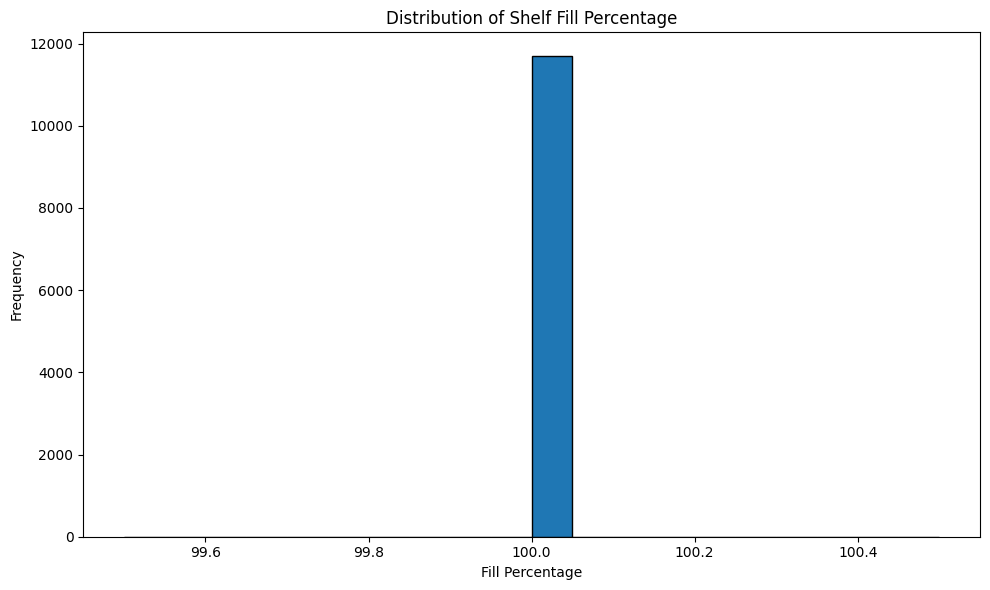

In [5]:
from EDA_func import *

stats_df = analyze_dataset_stats()
visualize_samples(3)
health_df = analyze_shelf_health_metrics()